In [5]:
import pandas as pd
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler,MultiLabelBinarizer
from keras import backend

from deepctr.models import DeepFM
from deepctr.models import FNN
from deepctr.models import *
from deepctr.inputs import SparseFeat,get_feature_names
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import mean_squared_error
import kerastuner
from tensorflow.python.keras.preprocessing.sequence import pad_sequences
from deepctr.inputs import SparseFeat, VarLenSparseFeat,get_feature_names
import math
from deepctr.inputs import  SparseFeat, DenseFeat,get_feature_names
from sklearn.metrics import log_loss, roc_auc_score,roc_curve,auc,precision_recall_fscore_support
import pandas_profiling
from tensorflow.python.keras.models import load_model
from deepctr.layers.utils import *
from deepctr.layers.core import *
from deepctr.layers.interaction import *

Using TensorFlow backend.


## Definition of functions

In [42]:
from deepctr.inputs import build_input_features, get_linear_logit, input_from_feature_columns
from deepctr.layers.core import PredictionLayer
from tensorflow.python.keras.models import Model
def LR(linear_feature_columns, dnn_hidden_units=(128,128), l2_reg_linear=1e-5,
        l2_reg_embedding=1e-5, l2_reg_dnn=0, init_std=0.0001, seed=1024, dnn_dropout=0, dnn_activation='relu',
        task='binary'):
    features = build_input_features(linear_feature_columns )

    inputs_list = list(features.values())

    linear_logit = get_linear_logit(features, linear_feature_columns, init_std=init_std, seed=seed, prefix='linear',
                                        l2_reg=l2_reg_linear)


    output = PredictionLayer(task)(linear_logit)

    model = Model(inputs=inputs_list, outputs=output)
    return model

In [51]:
def normalizeNumerical(inputfile,outputfile):
    df=pd.read_csv(inputfile)
    numFeatures = ["C1"]+['C'+str(i) for i in range(14, 22)]
    for numFeature in numFeatures:
        df[numFeature] = df[numFeature].apply(lambda x: x if x<2 else math.sqrt(math.log(x)))
    df.to_csv(outputfile)
    
def featureHour(filename):
    df=pd.read_csv(filename)
    df['hour']=df['hour'].apply(lambda x: x%24)
    df.to_csv(filename)

def rareFeature(inputfile,outputfile,threshold):
    """
    :param fileName: name of file which needs to handle rare feature values
    :param thershold: when the feature appears less than threshold instances, reassign 'other'
    :return: None
    """
    df=pd.read_csv(inputfile)
    categoryFeatures =["C1"]+['C'+str(i) for i in range(14, 22)] + ["hour","banner_pos","site_id","site_domain","site_category","app_id","app_domain","app_category","device_model","device_type","device_conn_type","device_id"]
    
    for col in categoryFeatures:
        a=datetime.now()
        value_counts = df[col].value_counts() # Specific column 
        to_remove = value_counts[value_counts <= threshold].index
        print(col,"to_remove founded")
        df[col].replace(to_remove, np.nan, inplace=True)
        print("------------------------",col,"filtered------------------------------------")
        b=datetime.now() 
        print((b-a).seconds)
    df.to_csv(outputfile)     
    
def negativeSampling(inputfile,outputfile,negativeRate):
    """
    :param filename: name of file which requires negative sampling
    :param negativeRate: number of times negative sample vs postive sample 
    :return: None
    """
    data=pd.read_csv(inputfile)
    numPos=(data['click'] != 0).sum()
    numNeg=numPos*negativeRate
    res=[]
    for index,row in data.iterrows():
        if row["click"]!=1:
            numNeg-=1
        res.append(row)
        if numNeg<0:
            break
    res=pd.DataFrame(res)
    res.to_csv(outputfile)
def draw_curve(LRTrue=None,LRPred=None,DNNTrue=None,DNNPred=None):
    import matplotlib.pyplot as plt
    plt.figure()
    lw = 1.5
    plt.figure(figsize=(8,8))
    if LRTrue is not None:
        LRfpr,LRtpr,LRthreshold = roc_curve(LRTrue, LRPred) ###计算真正率和假正率
        LRroc_auc = auc(LRfpr,LRtpr) ###计算auc的值
        plt.plot(LRfpr,LRtpr, color='lightslategrey',lw=lw, label='LR ROC curve (area = %0.4f)' % LRroc_auc) ###假正率为横坐标，真正率为纵坐标做曲线
    if DNNTrue is not None:
        DNNfpr,DNNtpr,DNNthreshold = roc_curve(DNNTrue, DNNPred) ###计算真正率和假正率
        DNNroc_auc = auc(DNNfpr,DNNtpr) ###计算auc的值
        plt.plot(DNNfpr,DNNtpr, color='tomato',lw=lw, label='DNN ROC curve (area = %0.4f)' % DNNroc_auc) ###假正率为横坐标，真正率为纵坐标做曲线
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

def draw_history(history):
    import matplotlib.pyplot as plt
    # print(history.history)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Crossentropy') 
    plt.ylabel('crossentropy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

def Matrics(y_true,y_pred,threshold):
    precision,recall,fscore,support=precision_recall_fscore_support(y_true, BinaryValue(y_pred,threshold),labels=[0,1])
    print("precision:",precision)
    print("recall:",recall)
    print("fscore:",fscore)
    print("support",support)
    print("test LogLoss", round(log_loss(y_true, y_pred), 4))
    print("test AUC", round(roc_auc_score(y_true,y_pred), 4))
def BinaryValue(pred_ans,threshold):
    pred_ans=[1 if x>threshold else 0 for x in pred_ans]
    
    
#     print(positiveRate)
    return pred_ans

def myGenerator(y_pred,y_train,batch_size):
    steps=y_pred.shape[0]//batch_size
    while True:
        for i in range(0,steps):
            batchX = np.zeros([batch_size,y_pred.shape[1] * num_leaf],dtype=np.int64)        
            for j in range(i*batch_size,(i+1)*batch_size):
                temp = np.arange(len(y_pred[0])) * num_leaf-1+ np.array(y_pred[j])
                batchX[j-i*batch_size][temp] += 1
#             batchX=y_pred[i*batch_size:(i+1)*batch_size]
            batchY=y_train[i*batch_size:(i+1)*batch_size]
            yield batchX,batchY

In [ ]:
featureHour("./dac/avazu_normalized.csv")

In [ ]:
normalizeNumerical("./dac/avazu/avazu.csv",'./dac/avazu/avazu_normalized.csv')

In [ ]:
rareFeature("./dac/avazu/avazu.csv","./dac/avazu/avazu_filteredFeatures.csv",20)

In [ ]:
avazu=pd.read_csv("./dac/avazu/avazu_filteredFeatures.csv")
print(avazu.info())

In [11]:
c=avazu['click'].apply(lambda x: 1 if x>0 else 0)
print(c.value_counts()[0]/c.value_counts()[1])

5.187946499014569


In [61]:
negativeSampling("./dac/avazu/avazu_filteredFeatures.csv","./dac/avazu/avazu_sampled.csv",4)

In [ ]:
data=pd.read_csv("./dac/avazu/avazu.csv")
pandas_profiling.ProfileReport(data)

## Load Data

In [4]:
data = pd.read_csv("./dac/avazu/avazu_filteredFeatures.csv")

sparse_features =["C1"]+['C'+str(i) for i in range(14, 22)]+ ["hour","banner_pos","site_id","site_domain","site_category","app_id","app_domain","app_category","device_id","device_ip","device_model","device_type","device_conn_type"]

# 
data[sparse_features] = data[sparse_features].fillna('-1', )

target = 'click'
# 1.Label Encoding for sparse features,and do simple Transformation for dense features
for feat in sparse_features:
    data=data.astype({feat: 'str'})
#     print(feat)
    lbe = LabelEncoder()
    data[feat] = lbe.fit_transform(data[feat])
    
# 2.count #unique features for each sparse field,and record dense feature field name

fixlen_feature_columns = [SparseFeat(feat, vocabulary_size=data[feat].nunique(),embedding_dim=40)
                       for i,feat in enumerate(sparse_features)]

dnn_feature_columns = fixlen_feature_columns
linear_feature_columns = fixlen_feature_columns

feature_names = get_feature_names(linear_feature_columns + dnn_feature_columns)

# 3.generate input data for model
data=data.astype({'hour': 'int32'})

train, test = train_test_split(data, test_size=0.2,random_state=1024)
train,validate=train_test_split(train,test_size=0.2,random_state=1024)
# train.to_csv("avazu_train.csv")
# test.to_csv("avazu_test.csv")
# train_model_input = {name:train[name] for name in feature_names}
# test_model_input = {name:test[name] for name in feature_names}
print("Data Loaded!")

Data Loaded!


In [5]:
test_model_input = {name:test[name] for name in feature_names}

## Generator

In [6]:
def myGenerator(train,batch_size):
    steps=train["C1"].size//batch_size
    while True:
        for i in range(0,steps):
            train_model_input = {name:train[name][i*batch_size:(i+1)*batch_size] for name in feature_names}
            train_model_target =train[target].values[i*batch_size:(i+1)*batch_size] 
            yield train_model_input,train_model_target
    

# All Sparse Features

## LR

In [7]:
model = LR(linear_feature_columns, dnn_feature_columns, task='binary')
model.compile(keras.optimizers.Adam(lr=0.0005), "binary_crossentropy",metrics=['accuracy'])

history=model.fit_generator(myGenerator(train,256),callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=2)],
#                                                                       keras.callbacks.ModelCheckpoint("AvazuDeepFM.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  epochs=50,steps_per_epoch=200,verbose=2,validation_data=myGenerator(validate,256),
                            validation_steps=validate["C1"].size//256)
pred_ans = model.predict(test_model_input, batch_size=256)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Epoch 1/50
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Epoch 1/50
1250/200 - 9s - loss: 0.4377 - acc: 0.8384
200/200 - 15s - loss: 0.5141 - acc: 0.8375 - val_loss: 0.4376 - val_acc: 0.8384
Epoch 2/50
Epoch 1/50
1250/200 - 9s - loss: 0.3965 - acc: 0.8384
200/200 - 13s - loss: 0.4262 - acc: 0.8371 - val_loss: 0.4148 - val_acc: 0.8384
Epoch 3/50
Epoch 1/50
1250/200 - 9s - loss: 0.3987 - acc: 0.8384
200/200 - 12s - loss: 0.4117 - acc: 0.8380 - val_loss: 0.4068 - val_acc: 0.8384
Epoch 4/50
Epoch 1/50
1250/200 - 9s - loss: 0.3785 - acc: 0.8386
200/200 - 12s - loss: 0.4055 - acc: 0.8379 - val_loss: 0.4024 - val_acc: 0.8386
Epoch 5/50
Epoch 1/50
1250/200 - 9s - loss: 0.4119 - a

Epoch 48/50
Epoch 1/50
1250/200 - 8s - loss: 0.3830 - acc: 0.8424
200/200 - 11s - loss: 0.3835 - acc: 0.8416 - val_loss: 0.3843 - val_acc: 0.8424
Epoch 49/50
Epoch 1/50
1250/200 - 8s - loss: 0.3821 - acc: 0.8423
200/200 - 11s - loss: 0.3865 - acc: 0.8411 - val_loss: 0.3842 - val_acc: 0.8423
Epoch 50/50
Epoch 1/50
1250/200 - 8s - loss: 0.3860 - acc: 0.8423
200/200 - 11s - loss: 0.3836 - acc: 0.8417 - val_loss: 0.3842 - val_acc: 0.8423


In [9]:
model=load_model("AvazuLR.h5",custom_objects={"InteractingLayer":InteractingLayer,'NoMask' : NoMask,"Linear":Linear,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
pred_ans=model.predict(test_model_input,batch_size=256)
# draw_history(history)
Matrics(test[target].values, pred_ans,0.5) 

precision: [0.8516008  0.56925153]
recall: [0.98381633 0.11091522]
fscore: [0.91294644 0.18565641]
support [335338  64662]
test LogLoss 0.3788
test AUC 0.7636


## FNN

In [12]:
fixlen_feature_columns = [SparseFeat(feat, vocabulary_size=data[feat].nunique(),embedding_dim=20)
                       for i,feat in enumerate(sparse_features)]

dnn_feature_columns = fixlen_feature_columns
linear_feature_columns = fixlen_feature_columns

feature_names = get_feature_names(linear_feature_columns + dnn_feature_columns)

# 3.generate input data for model
data=data.astype({'hour': 'int32'})

train, test = train_test_split(data, test_size=0.2,random_state=1024)
# train.to_csv("avazu_train.csv")
# test.to_csv("avazu_test.csv")
train_model_input = {name:train[name] for name in feature_names}
test_model_input = {name:test[name] for name in feature_names}
print("Data Loaded!")

Data Loaded!


In [8]:
model=FNN(linear_feature_columns,dnn_feature_columns,task='binary', dnn_dropout=0.2,)
model.compile(keras.optimizers.Adam(learning_rate=0.0005),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit_generator(myGenerator(train,256),callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=2),
                                                                      keras.callbacks.ModelCheckpoint("AvazuFNN.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  epochs=50,steps_per_epoch=200,verbose=2,validation_data=myGenerator(validate,256),
                            validation_steps=validate["C1"].size//256)



Epoch 1/50
Epoch 1/50
1250/200 - 14s - loss: 0.3981 - acc: 0.8395

Epoch 00001: val_loss improved from inf to 0.39716, saving model to AvazuFNN.h5
200/200 - 35s - loss: 0.4462 - acc: 0.8378 - val_loss: 0.3972 - val_acc: 0.8395
Epoch 2/50
Epoch 1/50
1250/200 - 14s - loss: 0.3695 - acc: 0.8403

Epoch 00002: val_loss improved from 0.39716 to 0.38737, saving model to AvazuFNN.h5
200/200 - 21s - loss: 0.3965 - acc: 0.8378 - val_loss: 0.3874 - val_acc: 0.8403
Epoch 3/50
Epoch 1/50
1250/200 - 13s - loss: 0.3812 - acc: 0.8412

Epoch 00003: val_loss improved from 0.38737 to 0.38578, saving model to AvazuFNN.h5
200/200 - 20s - loss: 0.3905 - acc: 0.8399 - val_loss: 0.3858 - val_acc: 0.8412
Epoch 4/50
Epoch 1/50
1250/200 - 13s - loss: 0.3548 - acc: 0.8416

Epoch 00004: val_loss improved from 0.38578 to 0.38254, saving model to AvazuFNN.h5
200/200 - 20s - loss: 0.3852 - acc: 0.8398 - val_loss: 0.3825 - val_acc: 0.8416
Epoch 5/50
Epoch 1/50
1250/200 - 13s - loss: 0.3943 - acc: 0.8418

Epoch 00005: 

NameError: name 'train_model_input' is not defined

In [9]:
model=load_model("AvazuFNN.h5",custom_objects={"InteractingLayer":InteractingLayer,'NoMask' : NoMask,"Linear":Linear,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
pred_ans=model.predict(test_model_input,batch_size=256)
# draw_history(history)
Matrics(test[target].values, pred_ans,0.5) 

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
precision: [0.85394596 0.57932375]
recall: [0.98193166 0.12904024]
fscore: [0.91347764 0.21106684]
support [335338  64662]
test LogLoss 0.3674
test AUC 0.785


## DeepFM

In [16]:
model=DeepFM(linear_feature_columns,dnn_feature_columns,task='binary',dnn_dropout=0.2,l2_reg_dnn=0.00001,l2_reg_embedding=0.00001,dnn_hidden_units=(128,128))
model.compile(keras.optimizers.Adam(learning_rate=0.0005),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit_generator(myGenerator(train,512),callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=2)],
#                                                                       keras.callbacks.ModelCheckpoint("AvazuDeepFM.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  epochs=50,steps_per_epoch=100,verbose=2,validation_data=myGenerator(validate,1024),
                            validation_steps=validate["C1"].size//1024)
pred_ans = model.predict(test_model_input, batch_size=512)

Epoch 1/50
Epoch 1/50
312/100 - 7s - loss: 0.4183 - acc: 0.8384
100/100 - 21s - loss: 0.4875 - acc: 0.8366 - val_loss: 0.4104 - val_acc: 0.8384
Epoch 2/50
Epoch 1/50
312/100 - 4s - loss: 0.4032 - acc: 0.8396
100/100 - 8s - loss: 0.4066 - acc: 0.8383 - val_loss: 0.3942 - val_acc: 0.8396
Epoch 3/50
Epoch 1/50
312/100 - 4s - loss: 0.3821 - acc: 0.8408
100/100 - 8s - loss: 0.3941 - acc: 0.8395 - val_loss: 0.3882 - val_acc: 0.8408
Epoch 4/50
Epoch 1/50
312/100 - 4s - loss: 0.3870 - acc: 0.8407
100/100 - 9s - loss: 0.3885 - acc: 0.8393 - val_loss: 0.3860 - val_acc: 0.8407
Epoch 5/50
Epoch 1/50
312/100 - 4s - loss: 0.3737 - acc: 0.8416
100/100 - 9s - loss: 0.3866 - acc: 0.8395 - val_loss: 0.3833 - val_acc: 0.8416
Epoch 6/50
Epoch 1/50
312/100 - 4s - loss: 0.3735 - acc: 0.8416
100/100 - 9s - loss: 0.3813 - acc: 0.8413 - val_loss: 0.3820 - val_acc: 0.8416
Epoch 7/50
Epoch 1/50
312/100 - 4s - loss: 0.3768 - acc: 0.8419
100/100 - 9s - loss: 0.3780 - acc: 0.8441 - val_loss: 0.3819 - val_acc: 0.841

In [17]:
#  model=load_model("AvazuDeepFM.h5",custom_objects={"InteractingLayer":InteractingLayer,'NoMask' : NoMask,"Linear":Linear,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
# pred_ans=model.predict(test_model_input,batch_size=256)
# draw_history(history)
Matrics(test[target].values, pred_ans,0.5) 

precision: [0.85426001 0.56977286]
recall: [0.98073884 0.1322879 ]
fscore: [0.9131406  0.21472231]
support [335338  64662]
test LogLoss 0.3687
test AUC 0.7838


In [ ]:
import matplotlib.pyplot as plt
# print(history.history)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model CE') 
plt.ylabel('CE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

## FGCNN

In [10]:
model = FGCNN(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
model.compile(keras.optimizers.Adam(learning_rate=0.0005),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit_generator(myGenerator(train,1024),callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=1)],
#                                                                       keras.callbacks.ModelCheckpoint("AvazuDeepFM.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  epochs=50,steps_per_epoch=200,verbose=2,validation_data=myGenerator(validate,256),
                            validation_steps=validate["C1"].size//256)


Epoch 1/50
Epoch 1/50
1250/200 - 92s - loss: 0.3903 - acc: 0.8399
200/200 - 259s - loss: 0.4370 - acc: 0.8365 - val_loss: 0.3892 - val_acc: 0.8399
Epoch 2/50
Epoch 1/50
1250/200 - 86s - loss: 0.3606 - acc: 0.8409
200/200 - 221s - loss: 0.3890 - acc: 0.8397 - val_loss: 0.3809 - val_acc: 0.8409
Epoch 3/50
Epoch 1/50
1250/200 - 724s - loss: 0.3764 - acc: 0.8414
200/200 - 867s - loss: 0.3845 - acc: 0.8409 - val_loss: 0.3783 - val_acc: 0.8414
Epoch 4/50
Epoch 1/50
1250/200 - 75s - loss: 0.3512 - acc: 0.8422
200/200 - 196s - loss: 0.3788 - acc: 0.8419 - val_loss: 0.3755 - val_acc: 0.8422
Epoch 5/50
Epoch 1/50
1250/200 - 74s - loss: 0.3806 - acc: 0.8427
200/200 - 196s - loss: 0.3807 - acc: 0.8409 - val_loss: 0.3741 - val_acc: 0.8427
Epoch 6/50
Epoch 1/50
1250/200 - 76s - loss: 0.3671 - acc: 0.8430
200/200 - 198s - loss: 0.3755 - acc: 0.8426 - val_loss: 0.3725 - val_acc: 0.8430
Epoch 7/50
Epoch 1/50
1250/200 - 76s - loss: 0.3701 - acc: 0.8428
200/200 - 202s - loss: 0.3696 - acc: 0.8427 - val_l

In [12]:
pred_ans = model.predict(test_model_input, batch_size=512)

Matrics(test[target].values, pred_ans,0.5) 

precision: [0.85566475 0.55229066]
recall: [0.97732735 0.14504655]
fscore: [0.91245845 0.22975356]
support [335338  64662]
test LogLoss 0.3706
test AUC 0.7804


## xDeepFM

In [32]:
model = xDeepFM(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.5, task='binary')
model.compile(keras.optimizers.Adam(learning_rate=0.0005),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit_generator(myGenerator(train,512),callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=1)],
#                                                                       keras.callbacks.ModelCheckpoint("AvazuDeepFM.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  epochs=50,steps_per_epoch=200,verbose=2,validation_data=myGenerator(validate,256),
                            validation_steps=validate["C1"].size//256)


Epoch 1/50
Epoch 1/50
1250/200 - 37s - loss: 0.3882 - acc: 0.8396
200/200 - 67s - loss: 0.4344 - acc: 0.8370 - val_loss: 0.3887 - val_acc: 0.8396
Epoch 2/50
Epoch 1/50
1250/200 - 31s - loss: 0.3643 - acc: 0.8412
200/200 - 46s - loss: 0.3884 - acc: 0.8392 - val_loss: 0.3840 - val_acc: 0.8412
Epoch 3/50
Epoch 1/50
1250/200 - 31s - loss: 0.3777 - acc: 0.8416
200/200 - 46s - loss: 0.3815 - acc: 0.8406 - val_loss: 0.3799 - val_acc: 0.8416
Epoch 4/50
Epoch 1/50
1250/200 - 31s - loss: 0.3530 - acc: 0.8424
200/200 - 47s - loss: 0.3798 - acc: 0.8422 - val_loss: 0.3781 - val_acc: 0.8424
Epoch 5/50
Epoch 1/50
1250/200 - 31s - loss: 0.3859 - acc: 0.8424
200/200 - 46s - loss: 0.3806 - acc: 0.8417 - val_loss: 0.3772 - val_acc: 0.8424
Epoch 6/50
Epoch 1/50
1250/200 - 32s - loss: 0.3704 - acc: 0.8426
200/200 - 47s - loss: 0.3759 - acc: 0.8420 - val_loss: 0.3757 - val_acc: 0.8426
Epoch 7/50
Epoch 1/50
1250/200 - 32s - loss: 0.3686 - acc: 0.8427
200/200 - 47s - loss: 0.3730 - acc: 0.8427 - val_loss: 0.3

In [33]:
pred_ans = model.predict(test_model_input, batch_size=512)
Matrics(test[target].values, pred_ans,0.5) 

precision: [0.85703365 0.55744067]
recall: [0.97619715 0.15548545]
fscore: [0.91274247 0.24314977]
support [335338  64662]
test LogLoss 0.3682
test AUC 0.7847


## AutoInt

In [13]:
model = AutoInt(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.5, task='binary')
model.compile(keras.optimizers.Adam(learning_rate=0.0005),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit_generator(myGenerator(train,512),callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=1)],
#                                                                       keras.callbacks.ModelCheckpoint("AvazuDeepFM.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  epochs=50,steps_per_epoch=200,verbose=2,validation_data=myGenerator(validate,256),
                            validation_steps=validate["C1"].size//256)



Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
dim is deprecated, use axis instead
Epoch 1/50
Epoch 1/50
1250/200 - 33s - loss: 0.3907 - acc: 0.8394
200/200 - 58s - loss: 0.4420 - acc: 0.8369 - val_loss: 0.3906 - val_acc: 0.8394
Epoch 2/50
Epoch 1/50
1250/200 - 30s - loss: 0.3653 - acc: 0.8412
200/200 - 47s - loss: 0.3898 - acc: 0.8389 - val_loss: 0.3844 - val_acc: 0.8412
Epoch 3/50
Epoch 1/50
1250/200 - 30s - loss: 0.3778 - acc: 0.8414
200/200 - 47s - loss: 0.3829 - acc: 0.8407 - val_loss: 0.3803 - val_acc: 0.8414
Epoch 4/50
Epoch 1/50
1250/200 - 31s - loss: 0.3525 - acc: 0.8422
200/200 - 48s - loss: 0.3808 - acc: 0.8419 - val_loss: 0.3783 - val_acc: 0.8422
Epoch 5/50
Epoch 1/50
1250/200 - 30s - loss: 0.3858 - acc: 0.8423
200/200 - 47s - loss: 0.3815 - acc: 0.8416 - val_loss: 0.3773 - val_acc: 0.8423
Epoch 6/50
Epoch 1/50
1250/200 - 30s - loss: 0.3703 - acc: 0.8424
200/200 - 47s - loss: 

In [14]:
pred_ans = model.predict(test_model_input, batch_size=512)
Matrics(test[target].values, pred_ans,0.5) 

precision: [0.85597216 0.56590678]
recall: [0.97836511 0.14626829]
fscore: [0.91308541 0.23245469]
support [335338  64662]
test LogLoss 0.3685
test AUC 0.7849


## GBDT

In [1]:
from __future__ import division
import json
import lightgbm as lgb
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LogisticRegression

In [6]:
data = pd.read_csv("./dac/avazu/avazu_filteredFeatures.csv")

categorical_features =["C1"]+['C'+str(i) for i in range(14, 22)]+ ["hour","banner_pos","site_id","site_domain","site_category","app_id","app_domain","app_category","device_id","device_ip","device_model","device_type","device_conn_type"]

# 
data[categorical_features] = data[categorical_features].fillna('-1', )

target = 'click'
data=data[categorical_features+['click']]
for feat in categorical_features:
    data[feat] =  pd.Categorical(data[feat]).codes

data[target]=data[target].apply(lambda x: 1 if x>0 else 0)    
data[categorical_features] = data[categorical_features].fillna('-1', )

# for numFeature in dense_features:
#     data[numFeature] = data[numFeature].apply(lambda x: x if x<2 else math.sqrt(math.log(x)))
train, test = train_test_split(data, test_size=0.2,random_state=1024)
y_train = train[target]  # training label
y_test = test[target]   # testing label
X_train = train.drop(columns=[target] , axis=1)  # training dataset
X_test = test.drop(columns=[target] , axis=1)  # testing dataset

# create dataset for lightgbm
lgb_train = lgb.Dataset(X_train, y_train,feature_name=categorical_features,
                        categorical_feature=categorical_features,free_raw_data=False)
# lgb_train.save_binary("train.bin")
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)

In [41]:
params = {
    'task': 'train',
    'boosting_type': 'gbdt',
    'is_unbalance':True,
    'max_depth':50,
    'objective': 'binary',
    'metric': {'binary_logloss','auc'},
    "min_child_samples": 5,   # for overfitting
	'num_trees': 100,
    'num_leaves':128,
    'learning_rate': 0.003,
    'feature_fraction': 1,   # Select a part of the features on each tree, for preventing overfitting and speed-up
    'bagging_fraction': 1,
    'bagging_freq': 2,
    'lambda_l1':0.0001,
    'lambda_l2':0.0001,
    'verbose': 1
}

# number of leaves,will be used in feature transformation


print('Start training...')
# train
gbm = lgb.train(params,
                lgb_train,
                valid_sets=lgb_train)
y_pred = gbm.predict(X_test)
print("test LogLoss", round(log_loss(test[target].values , y_pred ), 4))
print("test AUC", round(roc_auc_score(test[target].values , y_pred), 4))

Start training...


/Users/yxy/opt/anaconda3/lib/python3.7/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_trees` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))
/Users/yxy/opt/anaconda3/lib/python3.7/site-packages/lightgbm/basic.py:1291: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


[1]	training's binary_logloss: 0.441648	training's auc: 0.763179
[2]	training's binary_logloss: 0.441012	training's auc: 0.764251
[3]	training's binary_logloss: 0.44039	training's auc: 0.7653
[4]	training's binary_logloss: 0.439783	training's auc: 0.765412
[5]	training's binary_logloss: 0.439192	training's auc: 0.765501
[6]	training's binary_logloss: 0.438613	training's auc: 0.765743
[7]	training's binary_logloss: 0.438046	training's auc: 0.766236
[8]	training's binary_logloss: 0.437496	training's auc: 0.767072
[9]	training's binary_logloss: 0.436959	training's auc: 0.767462
[10]	training's binary_logloss: 0.436435	training's auc: 0.767657
[11]	training's binary_logloss: 0.435922	training's auc: 0.767745
[12]	training's binary_logloss: 0.435421	training's auc: 0.767918
[13]	training's binary_logloss: 0.434933	training's auc: 0.768076
[14]	training's binary_logloss: 0.434457	training's auc: 0.768218
[15]	training's binary_logloss: 0.433992	training's auc: 0.768276
[16]	training's binary

## LR+GBDT

In [30]:
def myGenerator(y_pred,y_train,batch_size):
    steps=y_pred.shape[0]//batch_size
    while True:
        for i in range(0,steps):
            batchX = np.zeros([batch_size,y_pred.shape[1] * num_leaf],dtype=np.int64)        
            for j in range(i*batch_size,(i+1)*batch_size):
                temp = np.arange(len(y_pred[0])) * num_leaf-1+ np.array(y_pred[j])
                batchX[j-i*batch_size][temp] += 1
#             batchX=y_pred[i*batch_size:(i+1)*batch_size]
            batchY=y_train[i*batch_size:(i+1)*batch_size]
            yield batchX,batchY

In [53]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from keras.regularizers import L1L2
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
y_pred = gbm.predict(X_train,pred_leaf=True)
indexRange=int(len(y_pred)*0.8)
batch_size=512
num_leaf = 128
model = Sequential()
model.add(Dense(1,activation='sigmoid',kernel_regularizer=L1L2(l1=0.0, l2=0.0001),input_dim=len(y_pred[0]) * num_leaf))
model.compile(Adam(lr=0.0005),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit_generator(myGenerator(y_pred[:indexRange],y_train[:indexRange],batch_size),callbacks=[keras.callbacks.EarlyStopping(monitor='loss',patience=5),
                                                                      ModelCheckpoint("GBDT+LR.h5",monitor="loss",verbose=1,save_best_only=True)], 
                            steps_per_epoch=indexRange//batch_size,epochs=50,verbose=2,
                           validation_data=myGenerator(y_pred[indexRange:len(y_pred)],y_train[indexRange:len(y_pred)],batch_size),
                            validation_steps=(len(y_pred)-indexRange)//batch_size)

Epoch 1/50
 - 86s - loss: 0.3766 - acc: 0.8414 - val_loss: 0.3730 - val_acc: 0.8415

Epoch 00001: loss improved from inf to 0.37660, saving model to GBDT+LR.h5
Epoch 2/50
 - 85s - loss: 0.3727 - acc: 0.8419 - val_loss: 0.3729 - val_acc: 0.8415

Epoch 00002: loss improved from 0.37660 to 0.37268, saving model to GBDT+LR.h5
Epoch 3/50
 - 85s - loss: 0.3725 - acc: 0.8420 - val_loss: 0.3728 - val_acc: 0.8415

Epoch 00003: loss improved from 0.37268 to 0.37246, saving model to GBDT+LR.h5
Epoch 4/50
 - 85s - loss: 0.3723 - acc: 0.8420 - val_loss: 0.3727 - val_acc: 0.8415

Epoch 00004: loss improved from 0.37246 to 0.37231, saving model to GBDT+LR.h5
Epoch 5/50
 - 85s - loss: 0.3722 - acc: 0.8420 - val_loss: 0.3727 - val_acc: 0.8415

Epoch 00005: loss improved from 0.37231 to 0.37221, saving model to GBDT+LR.h5
Epoch 6/50
 - 85s - loss: 0.3721 - acc: 0.8420 - val_loss: 0.3726 - val_acc: 0.8415

Epoch 00006: loss improved from 0.37221 to 0.37213, saving model to GBDT+LR.h5
Epoch 7/50
 - 85s - 

Epoch 00050: loss improved from 0.37101 to 0.37100, saving model to GBDT+LR.h5


In [57]:
y_test_pred = gbm.predict(X_test,pred_leaf=True)
model=load_model("GBDT+LR.h5")
pred_ans=model.predict_generator(myGenerator(y_test_pred,y_test,1024),steps=len(y_test)//1024)

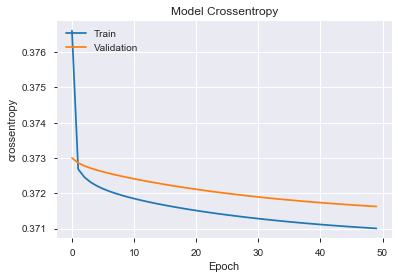

precision: [0.85485256 0.55115979]
recall: [0.97821055 0.1387439 ]
fscore: [0.9123808  0.22168329]
support [334795  64565]
test LogLoss 0.3771
test AUC 0.7668


In [58]:
draw_history(history)
# threshold=getTop20Threshold(pred_ans)
Matrics(y_test.values[:len(pred_ans)], pred_ans,0.5) 

In [6]:
import kerastuner
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
from tensorflow import keras
from deepctr.models import FGCNN
def buildDeepFM(hp):
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.6, step=0.1, default=0.5)
    model = DeepFM(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model

def buildPNN(hp):
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.6, step=0.1, default=0.5)
    model = PNN(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model
    
def buildFNN(hp):
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.6, step=0.1, default=0.5)
    model = FNN(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4,1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model

def buildFGCNN(hp):
    # k=40
    # conv=7*1
    #Kernal=[14,16,18,20]
    #new=[3,3,3,3]
    # ruenet=[4096,2048,1/]
#     activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.5, 0.8, step=0.1, default=0.5)
    model = FGCNN(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.5, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4,1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model

def buildAutoint(hp):
   
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.8, step=0.1, default=0.5)
    model=AutoInt(linear_feature_columns, dnn_feature_columns, dnn_use_bn=True, dnn_dropout=0, task='binary' )
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4,1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model
    
    
    
class MyTuner(kerastuner.tuners.BayesianOptimization):
    def run_trial(self, trial, *args, **kwargs):
        # You can add additional HyperParameters for preprocessing and custom training loops
        # via overriding `run_trial`
        kwargs['batch_size'] = trial.hyperparameters.Int('batch_size', 256, 1024, step=256)
        kwargs['epochs'] = trial.hyperparameters.Int('epochs', 10, 30, step=5)
        super(MyTuner, self).run_trial(trial, *args, **kwargs)
        
def HypermeterTune(model,directory):
    tuner = MyTuner(
        model,
        objective='val_binary_crossentropy',
        max_trials=5,
        executions_per_trial=2,
        directory=directory)

    tuner.search_space_summary()

    tuner.search(x=train_model_input,
                 y=train[target].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_binary_crossentropy',patience=2)],
                  validation_data=(test_model_input,test[target].values))
    print("finished")
    return tuner


In [7]:
def bestModel(tuner,batch_size,modelName):
    hps = tuner.get_best_hyperparameters()[0]
    es = EarlyStopping('val_binary_crossentropy', patience=1)
    best_model = tuner.hypermodel.build(hps)
    #callbacks=[es],
    history = best_model.fit(train_model_input, train[target].values,
                                batch_size=batch_size, epochs=20, verbose=2,validation_split=0.2)
    pred_ans = best_model.predict(test_model_input, batch_size=256)
    print("Final Result of ",modelName, " :")
    print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
    print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

In [35]:
tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values

{'activation': 'relu', 'dropout_rate': 0.0, 'batch_size': 1024, 'epochs': 15}

# Falsely Dense Features

## Autoint result

In [8]:
Autointtuner=HypermeterTune(buildAutoint,"turnAutoint")

INFO:tensorflow:Reloading Oracle from turnAutoint/untitled_project/oracle.json
INFO:tensorflow:Reloading Tuner from turnAutoint/untitled_project/tuner0.json


INFO:tensorflow:Oracle triggered exit
finished


In [9]:
Autointtuner.results_summary()
print(Autointtuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)
bestModel(Autointtuner,512,"Autoint")

{'activation': 'relu', 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 512, 'epochs': 25}
Train on 334458 samples, validate on 83615 samples
Epoch 1/20


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


334458/334458 - 42s - loss: 0.4306 - binary_crossentropy: 0.4306 - val_loss: 0.3840 - val_binary_crossentropy: 0.3838
Epoch 2/20
334458/334458 - 31s - loss: 0.3269 - binary_crossentropy: 0.3266 - val_loss: 0.3936 - val_binary_crossentropy: 0.3931
Epoch 3/20
334458/334458 - 31s - loss: 0.2516 - binary_crossentropy: 0.2510 - val_loss: 0.4341 - val_binary_crossentropy: 0.4334
Epoch 4/20
334458/334458 - 31s - loss: 0.2196 - binary_crossentropy: 0.2188 - val_loss: 0.4584 - val_binary_crossentropy: 0.4575
Epoch 5/20
334458/334458 - 31s - loss: 0.2070 - binary_crossentropy: 0.2061 - val_loss: 0.4798 - val_binary_crossentropy: 0.4789
Epoch 6/20
334458/334458 - 31s - loss: 0.2002 - binary_crossentropy: 0.1992 - val_loss: 0.5011 - val_binary_crossentropy: 0.5000
Epoch 7/20
334458/334458 - 29s - loss: 0.1959 - binary_crossentropy: 0.1948 - val_loss: 0.5026 - val_binary_crossentropy: 0.5014
Epoch 8/20


KeyboardInterrupt: 

In [15]:
model = AutoInt(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.6, task='binary')
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001), loss="binary_crossentropy",metrics=['binary_crossentropy'])
earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=1,baseline=None)
history = model.fit(train_model_input, train[target].values,
                    batch_size=512, epochs=25, callbacks=[earlystopping_callback],verbose=2, validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=256)

Train on 334458 samples, validate on 83615 samples
Epoch 1/25


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


334458/334458 - 42s - loss: 0.4143 - binary_crossentropy: 0.4142 - val_loss: 0.3961 - val_binary_crossentropy: 0.3959
Epoch 2/25
334458/334458 - 31s - loss: 0.3846 - binary_crossentropy: 0.3842 - val_loss: 0.3825 - val_binary_crossentropy: 0.3818
Epoch 3/25
334458/334458 - 30s - loss: 0.3371 - binary_crossentropy: 0.3360 - val_loss: 0.3909 - val_binary_crossentropy: 0.3895
Epoch 00003: early stopping


In [16]:

print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

test LogLoss 0.3883
test AUC 0.7709


## FGCNN result

In [98]:
FNNtuner=HypermeterTune("buildFGCNN","turnFGCNN")

Train on 1230861 samples, validate on 307716 samples
Epoch 1/10


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  74496/1230861 [>.............................] - ETA: 3:18:04 - loss: 0.5914 - binary_crossentropy: 0.59 - ETA: 1:08:15 - loss: 0.5673 - binary_crossentropy: 0.56 - ETA: 42:23 - loss: 0.5601 - binary_crossentropy: 0.5600 - ETA: 31:13 - loss: 0.5414 - binary_crossentropy: 0.54 - ETA: 24:57 - loss: 0.5119 - binary_crossentropy: 0.51 - ETA: 20:59 - loss: 0.5042 - binary_crossentropy: 0.50 - ETA: 18:12 - loss: 0.4892 - binary_crossentropy: 0.48 - ETA: 16:05 - loss: 0.4839 - binary_crossentropy: 0.48 - ETA: 14:32 - loss: 0.4743 - binary_crossentropy: 0.47 - ETA: 13:18 - loss: 0.4744 - binary_crossentropy: 0.47 - ETA: 12:16 - loss: 0.4713 - binary_crossentropy: 0.47 - ETA: 11:24 - loss: 0.4686 - binary_crossentropy: 0.46 - ETA: 10:41 - loss: 0.4685 - binary_crossentropy: 0.46 - ETA: 10:06 - loss: 0.4643 - binary_crossentropy: 0.46 - ETA: 9:34 - loss: 0.4587 - binary_crossentropy: 0.4577 - ETA: 9:07 - loss: 0.4552 - binary_crossentropy: 0.454 - ETA: 8:42 - loss: 0.4532 - binary_crossentropy

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  74496/1230861 [>.............................] - ETA: 3:00:36 - loss: 5.5278 - binary_crossentropy: 5.52 - ETA: 1:01:44 - loss: 2.9477 - binary_crossentropy: 2.94 - ETA: 38:01 - loss: 2.3408 - binary_crossentropy: 2.3407 - ETA: 27:53 - loss: 2.1439 - binary_crossentropy: 2.14 - ETA: 22:15 - loss: 2.1436 - binary_crossentropy: 2.14 - ETA: 18:36 - loss: 2.0427 - binary_crossentropy: 2.04 - ETA: 16:09 - loss: 1.9255 - binary_crossentropy: 1.92 - ETA: 14:17 - loss: 1.7661 - binary_crossentropy: 1.76 - ETA: 12:54 - loss: 1.6495 - binary_crossentropy: 1.64 - ETA: 11:47 - loss: 1.5503 - binary_crossentropy: 1.54 - ETA: 10:53 - loss: 1.4518 - binary_crossentropy: 1.45 - ETA: 10:09 - loss: 1.3706 - binary_crossentropy: 1.37 - ETA: 9:31 - loss: 1.3029 - binary_crossentropy: 1.3023 - ETA: 9:00 - loss: 1.2467 - binary_crossentropy: 1.246 - ETA: 8:32 - loss: 1.1955 - binary_crossentropy: 1.194 - ETA: 8:07 - loss: 1.1455 - binary_crossentropy: 1.144 - ETA: 7:45 - loss: 1.1054 - binary_crossentropy

Train on 1230861 samples, validate on 307716 samples
Epoch 1/25


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 148992/1230861 [==>...........................] - ETA: 1:35:45 - loss: 0.7243 - binary_crossentropy: 0.72 - ETA: 32:40 - loss: 0.6232 - binary_crossentropy: 0.6232 - ETA: 20:03 - loss: 0.5661 - binary_crossentropy: 0.56 - ETA: 14:40 - loss: 0.5349 - binary_crossentropy: 0.53 - ETA: 11:41 - loss: 0.5129 - binary_crossentropy: 0.51 - ETA: 9:46 - loss: 0.5097 - binary_crossentropy: 0.5094 - ETA: 8:26 - loss: 0.4896 - binary_crossentropy: 0.489 - ETA: 7:28 - loss: 0.4775 - binary_crossentropy: 0.476 - ETA: 6:43 - loss: 0.4645 - binary_crossentropy: 0.463 - ETA: 6:08 - loss: 0.4598 - binary_crossentropy: 0.459 - ETA: 5:39 - loss: 0.4518 - binary_crossentropy: 0.450 - ETA: 5:16 - loss: 0.4488 - binary_crossentropy: 0.447 - ETA: 4:56 - loss: 0.4493 - binary_crossentropy: 0.448 - ETA: 4:39 - loss: 0.4472 - binary_crossentropy: 0.445 - ETA: 4:25 - loss: 0.4460 - binary_crossentropy: 0.444 - ETA: 4:12 - loss: 0.4431 - binary_crossentropy: 0.441 - ETA: 4:01 - loss: 0.4399 - binary_crossentropy: 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 148480/1230861 [==>...........................] - ETA: 1:34:56 - loss: 0.9265 - binary_crossentropy: 0.92 - ETA: 32:25 - loss: 0.7173 - binary_crossentropy: 0.7173 - ETA: 19:55 - loss: 0.6244 - binary_crossentropy: 0.62 - ETA: 14:34 - loss: 0.5780 - binary_crossentropy: 0.57 - ETA: 11:35 - loss: 0.5434 - binary_crossentropy: 0.54 - ETA: 9:40 - loss: 0.5305 - binary_crossentropy: 0.5302 - ETA: 8:21 - loss: 0.5130 - binary_crossentropy: 0.512 - ETA: 7:24 - loss: 0.4995 - binary_crossentropy: 0.499 - ETA: 6:40 - loss: 0.4944 - binary_crossentropy: 0.493 - ETA: 6:06 - loss: 0.4894 - binary_crossentropy: 0.488 - ETA: 5:38 - loss: 0.4819 - binary_crossentropy: 0.481 - ETA: 5:14 - loss: 0.4755 - binary_crossentropy: 0.474 - ETA: 4:54 - loss: 0.4682 - binary_crossentropy: 0.466 - ETA: 4:37 - loss: 0.4623 - binary_crossentropy: 0.460 - ETA: 4:23 - loss: 0.4573 - binary_crossentropy: 0.455 - ETA: 4:10 - loss: 0.4537 - binary_crossentropy: 0.452 - ETA: 3:59 - loss: 0.4512 - binary_crossentropy: 

IndexError: list index out of range

In [107]:
FGCNNtuner.results_summary()
print(FGCNNtuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)
bestModel(FGCNNtuner,256,"FGCNN")

{'activation': 'relu', 'dropout_rate': 0.1, 'learning_rate': 0.001, 'batch_size': 512, 'epochs': 10}
Train on 984688 samples, validate on 246173 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


984688/984688 - 125s - loss: 0.3954 - binary_crossentropy: 0.3861 - val_loss: 0.3857 - val_binary_crossentropy: 0.3718
Epoch 2/15
984688/984688 - 122s - loss: 0.3807 - binary_crossentropy: 0.3638 - val_loss: 0.3872 - val_binary_crossentropy: 0.3704
Epoch 3/15
984688/984688 - 122s - loss: 0.3794 - binary_crossentropy: 0.3606 - val_loss: 0.3889 - val_binary_crossentropy: 0.3709
Final Result of  FGCNN  :
test LogLoss 0.372
test AUC 0.7745


## DeepFM Result

In [ ]:
DeepFMtuner=HypermeterTune(buildDeepFM,"turnDeepFM")

In [63]:
bestModel(tuner,512,"DeepFM")

Train on 984688 samples, validate on 246173 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


984688/984688 - 63s - loss: 0.3949 - binary_crossentropy: 0.3871 - val_loss: 0.3848 - val_binary_crossentropy: 0.3718
Epoch 2/15
984688/984688 - 60s - loss: 0.3778 - binary_crossentropy: 0.3608 - val_loss: 0.3881 - val_binary_crossentropy: 0.3701
Epoch 3/15
984688/984688 - 60s - loss: 0.3749 - binary_crossentropy: 0.3541 - val_loss: 0.3897 - val_binary_crossentropy: 0.3692
Epoch 4/15
984688/984688 - 60s - loss: 0.3728 - binary_crossentropy: 0.3496 - val_loss: 0.3911 - val_binary_crossentropy: 0.3683
Epoch 5/15
984688/984688 - 60s - loss: 0.3665 - binary_crossentropy: 0.3410 - val_loss: 0.3931 - val_binary_crossentropy: 0.3679
Epoch 6/15
984688/984688 - 60s - loss: 0.3526 - binary_crossentropy: 0.3264 - val_loss: 0.3952 - val_binary_crossentropy: 0.3692
Final Result of  DeepFM
test LogLoss 0.3696
test AUC 0.7812


## Result of FNN

In [7]:
FNNtuner=HypermeterTune(buildFNN,"turnFNN")

INFO:tensorflow:Reloading Oracle from turnFNN/untitled_project/oracle.json


Train on 1230861 samples, validate on 307716 samples
Epoch 1/10


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  73728/1230861 [>.............................] - ETA: 2:50:45 - loss: 2.3937 - binary_crossentropy: 2.39 - ETA: 58:47 - loss: 2.2568 - binary_crossentropy: 2.2567 - ETA: 36:20 - loss: 2.2320 - binary_crossentropy: 2.23 - ETA: 26:43 - loss: 2.1844 - binary_crossentropy: 2.18 - ETA: 21:21 - loss: 2.1870 - binary_crossentropy: 2.18 - ETA: 18:03 - loss: 2.1690 - binary_crossentropy: 2.16 - ETA: 15:38 - loss: 2.1303 - binary_crossentropy: 2.13 - ETA: 13:56 - loss: 2.1040 - binary_crossentropy: 2.10 - ETA: 12:37 - loss: 2.0601 - binary_crossentropy: 2.06 - ETA: 11:33 - loss: 2.0403 - binary_crossentropy: 2.04 - ETA: 10:42 - loss: 2.0167 - binary_crossentropy: 2.01 - ETA: 10:01 - loss: 1.9921 - binary_crossentropy: 1.99 - ETA: 9:26 - loss: 1.9668 - binary_crossentropy: 1.9667 - ETA: 8:58 - loss: 1.9396 - binary_crossentropy: 1.939 - ETA: 8:48 - loss: 1.9278 - binary_crossentropy: 1.927 - ETA: 8:23 - loss: 1.9093 - binary_crossentropy: 1.909 - ETA: 8:02 - loss: 1.8928 - binary_crossentropy: 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  74240/1230861 [>.............................] - ETA: 2:58:11 - loss: 1.0315 - binary_crossentropy: 1.03 - ETA: 1:01:06 - loss: 0.9596 - binary_crossentropy: 0.95 - ETA: 37:35 - loss: 0.9352 - binary_crossentropy: 0.9352 - ETA: 27:36 - loss: 0.9268 - binary_crossentropy: 0.92 - ETA: 21:58 - loss: 0.9045 - binary_crossentropy: 0.90 - ETA: 18:24 - loss: 0.8945 - binary_crossentropy: 0.89 - ETA: 15:57 - loss: 0.8772 - binary_crossentropy: 0.87 - ETA: 14:08 - loss: 0.8687 - binary_crossentropy: 0.86 - ETA: 12:44 - loss: 0.8633 - binary_crossentropy: 0.86 - ETA: 11:40 - loss: 0.8584 - binary_crossentropy: 0.85 - ETA: 10:46 - loss: 0.8533 - binary_crossentropy: 0.85 - ETA: 10:01 - loss: 0.8427 - binary_crossentropy: 0.84 - ETA: 9:24 - loss: 0.8350 - binary_crossentropy: 0.8350 - ETA: 8:53 - loss: 0.8284 - binary_crossentropy: 0.828 - ETA: 8:26 - loss: 0.8188 - binary_crossentropy: 0.818 - ETA: 8:03 - loss: 0.8106 - binary_crossentropy: 0.810 - ETA: 7:42 - loss: 0.8029 - binary_crossentropy

Train on 1230861 samples, validate on 307716 samples
Epoch 1/30


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  74240/1230861 [>.............................] - ETA: 2:53:42 - loss: 1.3148 - binary_crossentropy: 1.31 - ETA: 59:25 - loss: 1.2737 - binary_crossentropy: 1.2737 - ETA: 36:33 - loss: 1.2779 - binary_crossentropy: 1.27 - ETA: 26:48 - loss: 1.2602 - binary_crossentropy: 1.26 - ETA: 21:22 - loss: 1.2521 - binary_crossentropy: 1.25 - ETA: 17:54 - loss: 1.2205 - binary_crossentropy: 1.22 - ETA: 15:33 - loss: 1.2000 - binary_crossentropy: 1.19 - ETA: 13:51 - loss: 1.1913 - binary_crossentropy: 1.19 - ETA: 12:30 - loss: 1.1777 - binary_crossentropy: 1.17 - ETA: 11:26 - loss: 1.1739 - binary_crossentropy: 1.17 - ETA: 10:34 - loss: 1.1568 - binary_crossentropy: 1.15 - ETA: 9:51 - loss: 1.1456 - binary_crossentropy: 1.1456 - ETA: 9:16 - loss: 1.1342 - binary_crossentropy: 1.134 - ETA: 8:45 - loss: 1.1203 - binary_crossentropy: 1.120 - ETA: 8:19 - loss: 1.1057 - binary_crossentropy: 1.105 - ETA: 7:56 - loss: 1.0890 - binary_crossentropy: 1.089 - ETA: 7:35 - loss: 1.0807 - binary_crossentropy: 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  74496/1230861 [>.............................] - ETA: 2:57:21 - loss: 1.8368 - binary_crossentropy: 1.83 - ETA: 1:00:39 - loss: 1.8486 - binary_crossentropy: 1.84 - ETA: 37:16 - loss: 1.7606 - binary_crossentropy: 1.7606 - ETA: 27:15 - loss: 1.7356 - binary_crossentropy: 1.73 - ETA: 21:41 - loss: 1.6833 - binary_crossentropy: 1.68 - ETA: 18:11 - loss: 1.6358 - binary_crossentropy: 1.63 - ETA: 15:49 - loss: 1.6176 - binary_crossentropy: 1.61 - ETA: 14:02 - loss: 1.5882 - binary_crossentropy: 1.58 - ETA: 12:39 - loss: 1.5700 - binary_crossentropy: 1.57 - ETA: 11:34 - loss: 1.5534 - binary_crossentropy: 1.55 - ETA: 10:41 - loss: 1.5342 - binary_crossentropy: 1.53 - ETA: 9:57 - loss: 1.5211 - binary_crossentropy: 1.5211 - ETA: 9:20 - loss: 1.4909 - binary_crossentropy: 1.490 - ETA: 8:48 - loss: 1.4673 - binary_crossentropy: 1.467 - ETA: 8:22 - loss: 1.4481 - binary_crossentropy: 1.448 - ETA: 7:59 - loss: 1.4271 - binary_crossentropy: 1.427 - ETA: 7:39 - loss: 1.4054 - binary_crossentropy

Train on 1230861 samples, validate on 307716 samples
Epoch 1/25


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 223488/1230861 [====>.........................] - ETA: 1:00:37 - loss: 1.9569 - binary_crossentropy: 1.95 - ETA: 20:45 - loss: 1.8738 - binary_crossentropy: 1.8738 - ETA: 12:50 - loss: 1.8446 - binary_crossentropy: 1.84 - ETA: 9:25 - loss: 1.8359 - binary_crossentropy: 1.8359 - ETA: 7:31 - loss: 1.8148 - binary_crossentropy: 1.814 - ETA: 6:18 - loss: 1.7908 - binary_crossentropy: 1.790 - ETA: 5:27 - loss: 1.7783 - binary_crossentropy: 1.778 - ETA: 4:50 - loss: 1.7505 - binary_crossentropy: 1.750 - ETA: 4:21 - loss: 1.7297 - binary_crossentropy: 1.729 - ETA: 3:59 - loss: 1.7127 - binary_crossentropy: 1.712 - ETA: 3:42 - loss: 1.6813 - binary_crossentropy: 1.681 - ETA: 3:27 - loss: 1.6571 - binary_crossentropy: 1.657 - ETA: 3:14 - loss: 1.6353 - binary_crossentropy: 1.635 - ETA: 3:03 - loss: 1.6153 - binary_crossentropy: 1.615 - ETA: 2:54 - loss: 1.5975 - binary_crossentropy: 1.597 - ETA: 2:46 - loss: 1.5781 - binary_crossentropy: 1.578 - ETA: 2:39 - loss: 1.5586 - binary_crossentropy: 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 226560/1230861 [====>.........................] - ETA: 58:09 - loss: 1.0247 - binary_crossentropy: 1.02 - ETA: 20:04 - loss: 0.9773 - binary_crossentropy: 0.97 - ETA: 12:23 - loss: 0.9657 - binary_crossentropy: 0.96 - ETA: 9:06 - loss: 0.9437 - binary_crossentropy: 0.9437 - ETA: 7:15 - loss: 0.9459 - binary_crossentropy: 0.945 - ETA: 6:07 - loss: 0.9400 - binary_crossentropy: 0.940 - ETA: 5:17 - loss: 0.9292 - binary_crossentropy: 0.929 - ETA: 4:41 - loss: 0.9133 - binary_crossentropy: 0.913 - ETA: 4:14 - loss: 0.9047 - binary_crossentropy: 0.904 - ETA: 3:53 - loss: 0.9023 - binary_crossentropy: 0.902 - ETA: 3:35 - loss: 0.8915 - binary_crossentropy: 0.891 - ETA: 3:20 - loss: 0.8901 - binary_crossentropy: 0.890 - ETA: 3:07 - loss: 0.8831 - binary_crossentropy: 0.883 - ETA: 2:57 - loss: 0.8772 - binary_crossentropy: 0.877 - ETA: 2:47 - loss: 0.8763 - binary_crossentropy: 0.876 - ETA: 2:40 - loss: 0.8770 - binary_crossentropy: 0.876 - ETA: 2:33 - loss: 0.8774 - binary_crossentropy: 0.87

Train on 1230861 samples, validate on 307716 samples
Epoch 1/30


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 226560/1230861 [====>.........................] - ETA: 57:59 - loss: 0.8050 - binary_crossentropy: 0.80 - ETA: 19:49 - loss: 0.7065 - binary_crossentropy: 0.70 - ETA: 12:14 - loss: 0.6425 - binary_crossentropy: 0.64 - ETA: 8:58 - loss: 0.6098 - binary_crossentropy: 0.6096 - ETA: 7:09 - loss: 0.5793 - binary_crossentropy: 0.579 - ETA: 6:01 - loss: 0.5578 - binary_crossentropy: 0.557 - ETA: 5:13 - loss: 0.5431 - binary_crossentropy: 0.542 - ETA: 4:37 - loss: 0.5273 - binary_crossentropy: 0.526 - ETA: 4:10 - loss: 0.5153 - binary_crossentropy: 0.514 - ETA: 3:48 - loss: 0.5068 - binary_crossentropy: 0.505 - ETA: 3:31 - loss: 0.5001 - binary_crossentropy: 0.498 - ETA: 3:16 - loss: 0.4957 - binary_crossentropy: 0.494 - ETA: 3:04 - loss: 0.4919 - binary_crossentropy: 0.490 - ETA: 2:54 - loss: 0.4874 - binary_crossentropy: 0.485 - ETA: 2:45 - loss: 0.4830 - binary_crossentropy: 0.481 - ETA: 2:38 - loss: 0.4779 - binary_crossentropy: 0.475 - ETA: 2:31 - loss: 0.4736 - binary_crossentropy: 0.47

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 225792/1230861 [====>.........................] - ETA: 58:20 - loss: 2.1764 - binary_crossentropy: 2.17 - ETA: 19:58 - loss: 1.2973 - binary_crossentropy: 1.29 - ETA: 12:15 - loss: 1.1499 - binary_crossentropy: 1.14 - ETA: 8:58 - loss: 1.0080 - binary_crossentropy: 1.0077 - ETA: 7:08 - loss: 0.8854 - binary_crossentropy: 0.885 - ETA: 5:59 - loss: 0.8062 - binary_crossentropy: 0.805 - ETA: 5:11 - loss: 0.7496 - binary_crossentropy: 0.749 - ETA: 4:36 - loss: 0.7033 - binary_crossentropy: 0.702 - ETA: 4:09 - loss: 0.6722 - binary_crossentropy: 0.671 - ETA: 3:47 - loss: 0.6477 - binary_crossentropy: 0.646 - ETA: 3:30 - loss: 0.6291 - binary_crossentropy: 0.628 - ETA: 3:16 - loss: 0.6103 - binary_crossentropy: 0.609 - ETA: 3:04 - loss: 0.5938 - binary_crossentropy: 0.592 - ETA: 2:54 - loss: 0.5785 - binary_crossentropy: 0.576 - ETA: 2:45 - loss: 0.5654 - binary_crossentropy: 0.563 - ETA: 2:37 - loss: 0.5540 - binary_crossentropy: 0.552 - ETA: 2:30 - loss: 0.5454 - binary_crossentropy: 0.54

Train on 1230861 samples, validate on 307716 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 148992/1230861 [==>...........................] - ETA: 1:27:21 - loss: 0.7698 - binary_crossentropy: 0.76 - ETA: 29:57 - loss: 0.7687 - binary_crossentropy: 0.7687 - ETA: 18:26 - loss: 0.7665 - binary_crossentropy: 0.76 - ETA: 13:31 - loss: 0.7562 - binary_crossentropy: 0.75 - ETA: 10:50 - loss: 0.7573 - binary_crossentropy: 0.75 - ETA: 9:05 - loss: 0.7553 - binary_crossentropy: 0.7552 - ETA: 7:52 - loss: 0.7433 - binary_crossentropy: 0.743 - ETA: 7:00 - loss: 0.7379 - binary_crossentropy: 0.737 - ETA: 6:19 - loss: 0.7376 - binary_crossentropy: 0.737 - ETA: 5:47 - loss: 0.7358 - binary_crossentropy: 0.735 - ETA: 5:22 - loss: 0.7339 - binary_crossentropy: 0.733 - ETA: 5:00 - loss: 0.7277 - binary_crossentropy: 0.727 - ETA: 4:42 - loss: 0.7254 - binary_crossentropy: 0.725 - ETA: 4:26 - loss: 0.7219 - binary_crossentropy: 0.721 - ETA: 4:12 - loss: 0.7188 - binary_crossentropy: 0.718 - ETA: 4:01 - loss: 0.7190 - binary_crossentropy: 0.719 - ETA: 3:50 - loss: 0.7157 - binary_crossentropy: 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 148992/1230861 [==>...........................] - ETA: 1:29:13 - loss: 0.9859 - binary_crossentropy: 0.98 - ETA: 30:27 - loss: 0.9729 - binary_crossentropy: 0.9729 - ETA: 18:42 - loss: 0.9142 - binary_crossentropy: 0.91 - ETA: 13:42 - loss: 0.9024 - binary_crossentropy: 0.90 - ETA: 10:55 - loss: 0.8797 - binary_crossentropy: 0.87 - ETA: 9:09 - loss: 0.8619 - binary_crossentropy: 0.8619 - ETA: 7:55 - loss: 0.8501 - binary_crossentropy: 0.850 - ETA: 7:01 - loss: 0.8424 - binary_crossentropy: 0.842 - ETA: 6:19 - loss: 0.8386 - binary_crossentropy: 0.838 - ETA: 5:47 - loss: 0.8271 - binary_crossentropy: 0.827 - ETA: 5:20 - loss: 0.8174 - binary_crossentropy: 0.817 - ETA: 4:58 - loss: 0.8072 - binary_crossentropy: 0.807 - ETA: 4:39 - loss: 0.8027 - binary_crossentropy: 0.802 - ETA: 4:24 - loss: 0.7995 - binary_crossentropy: 0.799 - ETA: 4:11 - loss: 0.7949 - binary_crossentropy: 0.794 - ETA: 3:59 - loss: 0.7909 - binary_crossentropy: 0.790 - ETA: 3:49 - loss: 0.7840 - binary_crossentropy: 

INFO:tensorflow:Oracle triggered exit


In [21]:
FNNtuner.results_summary()
print(FNNtuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)
bestModel(FNNtuner,512,"FNNtuner")

{'activation': 'relu', 'dropout_rate': 0.1, 'learning_rate': 0.0001, 'batch_size': 256, 'epochs': 10}
Train on 984688 samples, validate on 246173 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


984688/984688 - 63s - loss: 0.4273 - binary_crossentropy: 0.4270 - val_loss: 0.3867 - val_binary_crossentropy: 0.3861
Epoch 2/15
984688/984688 - 60s - loss: 0.3810 - binary_crossentropy: 0.3800 - val_loss: 0.3819 - val_binary_crossentropy: 0.3804
Epoch 3/15
984688/984688 - 60s - loss: 0.3745 - binary_crossentropy: 0.3724 - val_loss: 0.3800 - val_binary_crossentropy: 0.3773
Epoch 4/15
984688/984688 - 60s - loss: 0.3698 - binary_crossentropy: 0.3664 - val_loss: 0.3785 - val_binary_crossentropy: 0.3745
Epoch 5/15
984688/984688 - 60s - loss: 0.3618 - binary_crossentropy: 0.3570 - val_loss: 0.3755 - val_binary_crossentropy: 0.3701
Epoch 6/15
984688/984688 - 61s - loss: 0.3438 - binary_crossentropy: 0.3378 - val_loss: 0.3758 - val_binary_crossentropy: 0.3694
Epoch 7/15
984688/984688 - 60s - loss: 0.3223 - binary_crossentropy: 0.3156 - val_loss: 0.3835 - val_binary_crossentropy: 0.3766
Final Result of  FNNtuner  :
test LogLoss 0.3755
test AUC 0.7789


## Result of DeepFM

## Result of PNN

In [42]:
PNNtuner=HypermeterTune(buildPNN,"turnPNN1")

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

RuntimeError: Too many failed attempts to build model.

In [75]:
tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values

{'activation': 'elu',
 'dropout_rate': 0.1,
 'learning_rate': 0.001,
 'batch_size': 1024,
 'epochs': 30}

In [76]:
bestModel(tuner,512,"PNN")

Train on 984688 samples, validate on 246173 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


984688/984688 - 63s - loss: 0.3942 - binary_crossentropy: 0.3866 - val_loss: 0.3851 - val_binary_crossentropy: 0.3723
Epoch 2/15
984688/984688 - 61s - loss: 0.3779 - binary_crossentropy: 0.3611 - val_loss: 0.3876 - val_binary_crossentropy: 0.3698
Epoch 3/15
984688/984688 - 61s - loss: 0.3752 - binary_crossentropy: 0.3548 - val_loss: 0.3897 - val_binary_crossentropy: 0.3695
Epoch 4/15
984688/984688 - 61s - loss: 0.3734 - binary_crossentropy: 0.3511 - val_loss: 0.3911 - val_binary_crossentropy: 0.3692
Epoch 5/15
984688/984688 - 61s - loss: 0.3712 - binary_crossentropy: 0.3472 - val_loss: 0.3916 - val_binary_crossentropy: 0.3682
Epoch 6/15
984688/984688 - 61s - loss: 0.3676 - binary_crossentropy: 0.3422 - val_loss: 0.3925 - val_binary_crossentropy: 0.3677
Epoch 7/15
984688/984688 - 61s - loss: 0.3629 - binary_crossentropy: 0.3365 - val_loss: 0.3949 - val_binary_crossentropy: 0.3690
Final Result of  PNN
test LogLoss 0.3697
test AUC 0.7801


## Result of LR model

In [55]:
from deepctr.inputs import build_input_features, get_linear_logit, input_from_feature_columns
from deepctr.layers.core import PredictionLayer
from tensorflow.python.keras.models import Model
model = LR(linear_feature_columns, task='binary')
model.compile("adam", "binary_crossentropy",metrics=['binary_crossentropy'])

earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=1,baseline=None)
history = model.fit(train_model_input, train[target].values,
                    batch_size=1024, epochs=15, verbose=2, validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=256)

Train on 984688 samples, validate on 246173 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


984688/984688 - 23s - loss: 0.3908 - binary_crossentropy: 0.3864 - val_loss: 0.3830 - val_binary_crossentropy: 0.3746
Epoch 2/15
984688/984688 - 21s - loss: 0.3746 - binary_crossentropy: 0.3630 - val_loss: 0.3853 - val_binary_crossentropy: 0.3719
Epoch 3/15
984688/984688 - 21s - loss: 0.3714 - binary_crossentropy: 0.3559 - val_loss: 0.3873 - val_binary_crossentropy: 0.3712
Epoch 4/15
984688/984688 - 21s - loss: 0.3704 - binary_crossentropy: 0.3530 - val_loss: 0.3881 - val_binary_crossentropy: 0.3706
Epoch 5/15
984688/984688 - 21s - loss: 0.3698 - binary_crossentropy: 0.3514 - val_loss: 0.3889 - val_binary_crossentropy: 0.3708
Epoch 6/15
984688/984688 - 21s - loss: 0.3696 - binary_crossentropy: 0.3507 - val_loss: 0.3889 - val_binary_crossentropy: 0.3704
Epoch 7/15
984688/984688 - 21s - loss: 0.3694 - binary_crossentropy: 0.3502 - val_loss: 0.3890 - val_binary_crossentropy: 0.3704
Epoch 8/15
984688/984688 - 21s - loss: 0.3692 - binary_crossentropy: 0.3499 - val_loss: 0.3900 - val_binary_

In [56]:
print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

test LogLoss 0.3707
test AUC 0.7752
